# Правила оформления

Здесь (или в сгенерированном вами html / pdf / ...) должны находиться картинки и слова к ним. Картинки должны содержать всевозможную интересную информацию, которые вы достали из данных с помощью методов визуализации. Слова должны являть собой ваши размышления об увиденном на картинке и вообще обо всем, что вы об этом думаете. Чем полезнее в совокупности будет представленная здесь информация и аккуратнее ваша работа, тем больше баллов вы за это получите.

- вы можете в качестве research-хранилища прикрепить ноутбук / html / pdf / ... - что угодно, главное, чтобы все картинки и 
    слова были видны. Если какие-то или все картинки не видны, их нужно прикрепить в классрум и указать название картинки,
    о которой идет речь в ваших рассуждениях
- чтобы картинки были видны, можно:
    - рисовать их в matplotlib / seaborn (изучаете в plotly / bokeh, достаете точки и рисуете, напр. seaborn'ом)
    - делать скрины
    - сохранять картинки через plotly-API (кнопка справа вверху на графике сохраняет картинку в том виде, в котором она сейчас 
        есть - с зумом, поворотом и тп)
    - plotly: `fig.show(renderer='png')` [нужно поставить kaleido: `!pip install kaleido==0.1.0post1`]
    - кидать картинки "в интернет" (напр. в гугл диск) и вставлять через ссылки
    - что угодно еще, лишь бы их было видно или они были скинуты в классрум
- чтобы проверить, видны ли картинки в колабе, можно просто сохранить ваш ноутбук и загрузить в колаб
    (bokeh вроде видно, но я не уверен, что он не исчезнет со временем - кидайте картинки на всякий случай или рисуйте в mpl / seaborn)
- скидывать картинки нужно все в отдельном архиве
    
- картинка "засчитывается" (за нее ставятся баллы), только если рядом с ней находятся какие-то слова, поясняющие, что вы на ней 
    видите и на какие мысли это вас наталкивает (+ сама картинка видна или скинута, если скинута, то указано ее название)
    
- распределения оригинальных признаков кидать не нужно!


<br>

Блок ниже дан, чтобы вы проверили, какие варианты видны в колабе, какие - нет. Его можно удалить, когда вам все станет ясно.

## Что как рендерится

Попробуйте запустить этот блок, а потом сохраните ноутбук и загрузите его в https://colab.research.google.com,
        чтобы посмотреть, что к чему. Также советую посмотреть семинар 13.12, чтобы услышать какие-то дополнительные слова по 
        этому поводу.

In [2]:
import pandas as pd, numpy as np

tr = pd.read_csv('data/train.csv')
tst = pd.read_csv('data/test.csv').assign(smoking=-1)

tr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 23 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   age                  10000 non-null  int64  
 1   height_cm            10000 non-null  int64  
 2   weight_kg            10000 non-null  int64  
 3   waist_cm             10000 non-null  float64
 4   eyesight_left        10000 non-null  float64
 5   eyesight_right       10000 non-null  float64
 6   hearing_left         10000 non-null  int64  
 7   hearing_right        10000 non-null  int64  
 8   systolic             10000 non-null  int64  
 9   relaxation           10000 non-null  int64  
 10  fasting_blood_sugar  10000 non-null  int64  
 11  cholesterol          10000 non-null  int64  
 12  triglyceride         10000 non-null  int64  
 13  hdl                  10000 non-null  int64  
 14  ldl                  10000 non-null  int64  
 15  hemoglobin           10000 non-null  

In [2]:
#

In [3]:
tr['new_log_gtp'] = np.log1p(tr.gtp)
tst['new_log_gtp'] = np.log1p(tst.gtp)

my_favorite_cols = ['age', 'height_cm', 'weight_kg', 'hemoglobin', 'new_log_gtp']

import plotly.express as px

fig = px.scatter_3d(tr, x='age', y='hemoglobin', z='new_log_gtp', color='smoking')
_ = fig.update_traces(marker_size=2.5)


fig.show() # (не работает)

**`html-вставка картинки с компьютера`** (не работает)

<img src='img/newplot.png'>

**`html-вставка картинки по ссылке из интернета`** (работает)

<img src='https://images.datacamp.com/image/upload/v1679396621/Plotly_Express_242e999c38.gif'>

In [5]:
plot_cols = np.r_[my_favorite_cols, ['smoking']]
plot_data_tr = tr[plot_cols].copy()
plot_data_tst = tst[plot_cols].sample(1_000, random_state=911)

# СКЕЙЛИНГ
means = plot_data_tr[my_favorite_cols].mean(axis=0)
stds = plot_data_tr[my_favorite_cols].std(axis=0)

plot_data_tr.loc[:, my_favorite_cols] = (plot_data_tr.loc[:, my_favorite_cols] - means) / stds
plot_data_tst.loc[:, my_favorite_cols] = (plot_data_tst.loc[:, my_favorite_cols] - means) / stds

plot_data_scaled = pd.concat([plot_data_tr, plot_data_tst], axis=0, sort=False, ignore_index=True)

**`bokeh`** (вроде работает) и **`plotly через ipywidgets`** (не работает)

In [6]:
from utils.reductors import *
from utils.utils import plot_dim_reduction
from collections import namedtuple


hue_info = namedtuple('hue_info', ['field_name', 'is_categorical'])


def plot_standard_embeddings(plot_data, features, return_results=False):
    '''
    рисует "какие-то" эмбеддинги с hue='smoking' на одних и тех же фичах features
    '''
    mapper_dict = {
        'UMAP 2D n_neighbors=17': {
            'params': {
               'n_neighbors': 17,
               'min_dist': 0.1,
               'n_jobs': 8,
               'verbose': False,
               'n_components': 2
            },
            'func': make_umap,
        },
        'PCA 3D': {
            'params': {
               'n_components': 3
            },
            'func': make_pca,
        },
    }

    res = plot_dim_reduction(
        data=plot_data,
        mapper_dict=mapper_dict,
        default_features=features,
        default_hue_info=hue_info(field_name='smoking', is_categorical=True),
        row_height=450,
        return_results=return_results
    )
    return res

plot_standard_embeddings(plot_data_scaled, my_favorite_cols, return_results=False)

Loading BokehJS ...

100%|███████████████████████████████████████████████| 2/2 [00:15<00:00,  7.94s/it]


    'data': [{'hovertemplate': 'smoking=1<br>x=%{x}<br>y=%{y}<br>z=%{z}<extra></…

## Итак, начнем смотреть данные

In [1]:
from utils.utils import plot_dim_reduction
from utils.reductors import *

c:\Users\alexe\anaconda3\envs\environment_2023_24yml1\lib\site-packages\umap\distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
c:\Users\alexe\anaconda3\envs\environment_2023_24yml1\lib\site-packages\umap\distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
c:\Users\alexe\anaconda3\envs\environment_2023_24yml1\

In [2]:
import pandas as pd, numpy as np

%load_ext autoreload
%autoreload 2

In [3]:
tr = pd.read_csv('data/train.csv')
tst = pd.read_csv('data/test.csv').assign(smoking=-1)

tr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 23 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   age                  10000 non-null  int64  
 1   height_cm            10000 non-null  int64  
 2   weight_kg            10000 non-null  int64  
 3   waist_cm             10000 non-null  float64
 4   eyesight_left        10000 non-null  float64
 5   eyesight_right       10000 non-null  float64
 6   hearing_left         10000 non-null  int64  
 7   hearing_right        10000 non-null  int64  
 8   systolic             10000 non-null  int64  
 9   relaxation           10000 non-null  int64  
 10  fasting_blood_sugar  10000 non-null  int64  
 11  cholesterol          10000 non-null  int64  
 12  triglyceride         10000 non-null  int64  
 13  hdl                  10000 non-null  int64  
 14  ldl                  10000 non-null  int64  
 15  hemoglobin           10000 non-null  

### Pаспределение всех данных есть в основном ноутбуке, поэтому здесь просто будем уже исходя из известных распределений что-то придумывать

### Составим список колонок, в которых есть различия в распределении:
1) 'age' - СИЛЬНО
2) 'height_cm' - СИЛЬНО
3) 'hemoglobine' - СИЛЬНО
4) 'gtp' - СИЛЬНО
5) 'triglyceride' - СИЛЬНО
6) 'alt' - СРЕДНЕ
7) 'hdl' - СРЕДНЕ
8) 'serum_creatinine' - СРЕДНЕ
9) 'weight_kg' - СРЕДНЕ
10) 'waist_cm' - СРЕДНЕ
10) 'relaxation' - СЛАБО

In [4]:
import plotly.express as px

In [5]:
tr['new_log_gtp'] = np.log1p(tr.gtp)
tst['new_log_gtp'] = np.log1p(tst.gtp)

favorite_cols = ['age', 'height_cm', 'hemoglobin', 'new_log_gtp', 'triglyceride']

Чуть-чуть порисуем графики

In [6]:
fig = px.scatter_3d(tr, x='age', y='height_cm', z='hemoglobin', color='smoking')
fig.update_traces(marker_size=2.5)
fig.show()

Из этого графика можно сделать вывод о том, что курящие - это более высокие люди с ,более низким гемоглобином и более высоким возрастом. Но это все примерно пока четкого разделения нет.

In [7]:
fig = px.scatter_3d(tr, x='age', y='height_cm', z='new_log_gtp', color='smoking')
fig.update_traces(marker_size=2.5)
fig.show()

Про new_log_gtp пока ничего сказать нельзя

In [8]:
fig = px.scatter_3d(tr, x='age', y='height_cm', z='triglyceride', color='smoking')
fig.update_traces(marker_size=2.5)
fig.show()

Возьмем весть трейн и немного теста, чтобы долго не ждать.

In [9]:
plot_cols = np.r_[favorite_cols, ['smoking']]
plot_data_tr = tr[plot_cols].copy()
plot_data_tst = tst[plot_cols].sample(1_000, random_state=911)
plot_data = pd.concat([plot_data_tr, plot_data_tst], axis=0, sort=False, ignore_index=True)

Наученные опытом, скейлим все признаки.

In [10]:
means = plot_data_tr[favorite_cols].mean(axis=0)
stds = plot_data_tr[favorite_cols].std(axis=0)

plot_data_tr.loc[:, favorite_cols] = (plot_data_tr.loc[:, favorite_cols] - means) / stds
plot_data_tst.loc[:, favorite_cols] = (plot_data_tst.loc[:, favorite_cols] - means) / stds
plot_data_scaled = pd.concat([plot_data_tr, plot_data_tst], axis=0, sort=False, ignore_index=True)

Напишем helper-функцию

In [11]:
from collections import namedtuple

In [12]:
hue_info = namedtuple('hue_info', ['field_name', 'is_categorical'])

def plot_standard_embeddings(plot_data, features, return_results=False):
    '''
    рисует "какие-то" эмбеддинги с hue='smoking' на одних и тех же фичах features
    '''
    mapper_dict = {
        'tsne 2D perplexity=60 exaggeration=4': {
            'params': {
                'n_jobs': 8,
                'perplexity': 60,
                'verbose': False,
                'n_components': 2,
                'exaggeration': 4,
                'neighbors': 'pynndescent' # annoy - neighbors по умолчанию - почему-то виснет на .transform
            },
            'func': make_tsne,
        },
        'tsne 2D perplexity=60 exaggeration=4 dof=0.5': {
            'params': {
                'n_jobs': -1,
                'perplexity': 60,
                'verbose': False,
                'n_components': 2,
                'exaggeration': 4,
                'dof': 0.5,
                'neighbors': 'pynndescent'
            },
            'func': make_tsne,
        },
        'UMAP 2D n_neighbors=17': {
            'params': {
               'n_neighbors': 17,
               'min_dist': 0.1,
               'n_jobs': 8,
               'verbose': False,
               'n_components': 2
            },
            'func': make_umap,
        },
        'PCA 3D': {
            'params': {
               'n_components': 3
            },
            'func': make_pca,
        },
    }

    res = plot_dim_reduction(
        data=plot_data,
        mapper_dict=mapper_dict,
        default_features=features,
        default_hue_info=hue_info(field_name='smoking', is_categorical=True),
        row_height=450,
        return_results=return_results
    )
    return res

Нарисуем отскейленные признаки

In [13]:
results = plot_standard_embeddings(plot_data_scaled, favorite_cols, return_results=True)

Loading BokehJS ...

100%|██████████| 4/4 [02:31<00:00, 37.93s/it]


    'data': [{'hovertemplate': 'smoking=1<br>x=%{x}<br>y=%{y}<br>z=%{z}<extra></…

Из этого графика мы можем сделать явный вывод о том, что мы почти точно можем выделить кучку, которую четко можно отнести к некурящим. Это красный кусок на 3D графике и отдельный небольшой островок на раздвинутом t-NSE.

In [14]:
results

{'tsne 2D perplexity=60 exaggeration=4': {'embedding': TSNEEmbedding([[ 1.08780056, -0.88227455],
                 [ 2.3372116 , -3.17766046],
                 [ 0.04955509,  1.49091133],
                 ...,
                 [-2.79400744, -2.09259527],
                 [-1.11586311,  1.93208098],
                 [ 2.23980368, -2.75277267]]),
  'mapper': None},
 'tsne 2D perplexity=60 exaggeration=4 dof=0.5': {'embedding': TSNEEmbedding([[ 3.47660029, -1.17928962],
                 [ 5.5361936 , -2.53683075],
                 [ 1.07703062,  0.74615017],
                 ...,
                 [-8.3292741 , -1.46729034],
                 [-0.03783261,  0.98012772],
                 [ 5.46216889, -2.26039426]]),
  'mapper': None},
 'UMAP 2D n_neighbors=17': {'embedding': array([[ 9.044351 ,  4.880079 ],
         [15.355219 ,  5.188194 ],
         [ 7.963106 ,  7.511391 ],
         ...,
         [ 3.4163554,  3.3148878],
         [ 3.5729373,  8.902977 ],
         [14.690869 ,  5.2246747

In [15]:
%%time
tsne_mapper_embedding = results['tsne 2D perplexity=60 exaggeration=4 dof=0.5']['embedding']

data_tst = tst[favorite_cols].copy()
data_tst.loc[:, favorite_cols] = (data_tst.loc[:, favorite_cols] - means) / stds

tsne_test_embedding = tsne_mapper_embedding.transform(data_tst[favorite_cols], perplexity=60)

CPU times: total: 8min 28s
Wall time: 1min 23s


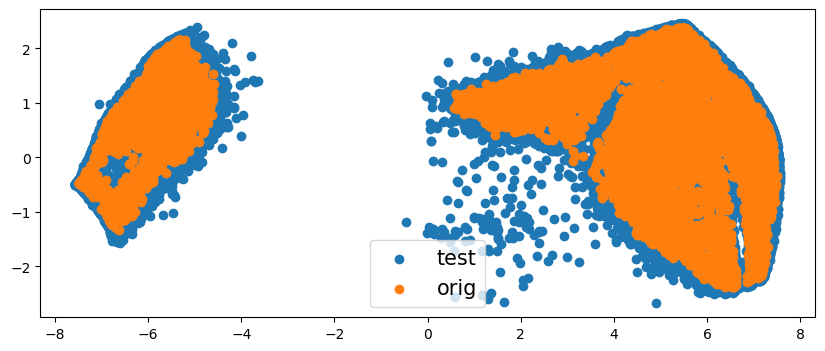

In [16]:
import matplotlib.pyplot as plt

plt.scatter(x=tsne_test_embedding[:, 0], y=tsne_test_embedding[:, 1], label='test')
plt.scatter(x=tsne_mapper_embedding[:, 0], y=tsne_mapper_embedding[:, 1], label='orig')
plt.legend(fontsize=15)
plt.gcf().set_size_inches(10, 4)

Видим, что распределение примерно одинаково, то есть можно испольщовать обученную на трейне модельку.

In [17]:
%%time
import fast_hdbscan # немного долго импортируется в первый раз

hdbscan = fast_hdbscan.HDBSCAN(min_samples=10, min_cluster_size=50)
clusters = hdbscan.fit_predict(tsne_test_embedding)

CPU times: total: 40.5 s
Wall time: 40.9 s


<Axes: >

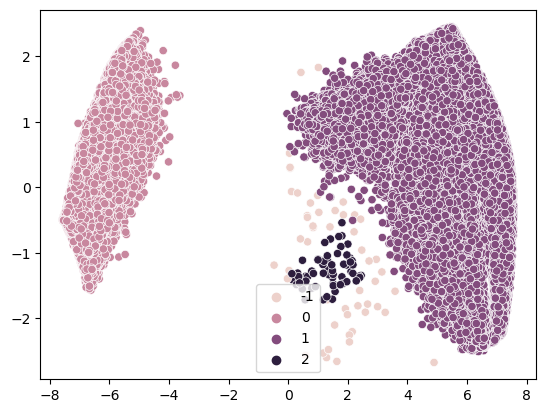

In [18]:
import seaborn as sns

sns.scatterplot(x=tsne_test_embedding[:, 0], y=tsne_test_embedding[:, 1], hue=clusters)

Теперь все, кто из теста попадают в левый "островок" будут некурильщики.

In [19]:
y_pred = tst.smoking
y_pred.loc[clusters == 0] = 0

n_other = (clusters != 0).sum()
y_pred.loc[clusters != 0] = np.random.choice([0, 1], size=n_other)

y_pred.value_counts()

C:\Users\alexe\AppData\Local\Temp\ipykernel_2212\2679163917.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\alexe\AppData\Local\Temp\ipykernel_2212\2679163917.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



0    97594
1    51662
Name: smoking, dtype: int64

In [20]:
res = pd.DataFrame({'id': np.arange(tst.shape[0]), 'smoking': y_pred})
res

,id,smoking
0,0,1
1,1,1
2,2,0
3,3,0
4,4,1
...,...,...
149251,149251,1
149252,149252,0
149253,149253,0
149254,149254,0


In [21]:
res.to_csv('data/sub1.csv', index=False)

После такой рандомной штуки получаем соответствующий скор - примерно 0.25. Дальше надо думать, что можно сделать и как достать и разъединить курильщиков и некурильщиков из правого, большего "островка".

Первым делом можем убрать из рассмотрения всех из левой кучки и дальше исследовать только правую кучку. Причем мы можем не просто зафиксировать значения, равные 0, в тестовой выборке, а посчитать их за известные и добавить в трейн (мне кажется это неплохой идеей). Будем пробовать.

In [22]:
(clusters == 0).sum()

46225

In [23]:
tmp = tst[clusters == 0]
tmp.smoking = 0
tmp

C:\Users\alexe\AppData\Local\Temp\ipykernel_2212\765475738.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,age,height_cm,weight_kg,waist_cm,eyesight_left,eyesight_right,hearing_left,hearing_right,systolic,relaxation,...,ldl,hemoglobin,urine_protein,serum_creatinine,ast,alt,gtp,dental_caries,smoking,new_log_gtp
6,45,160,55,69.0,1.5,1.2,1,1,150,88,...,122,13.0,1,0.7,17,12,16,0,0,2.833213
8,40,155,50,73.0,1.5,1.5,1,1,105,70,...,122,13.2,1,0.7,22,16,14,0,0,2.708050
9,40,155,50,68.0,0.8,0.6,1,1,107,60,...,101,12.9,3,0.7,17,11,8,0,0,2.197225
10,40,155,55,80.0,0.8,0.8,1,1,95,65,...,56,12.6,1,0.7,21,15,9,1,0,2.302585
14,40,160,65,78.0,1.2,1.0,1,1,130,81,...,141,8.6,1,0.8,16,12,11,0,0,2.484907
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149241,40,160,45,66.0,1.2,1.5,1,1,113,68,...,97,12.6,1,0.7,42,42,21,0,0,3.091042
149247,40,165,60,70.0,0.9,1.2,1,1,103,60,...,110,13.7,1,0.7,18,8,7,0,0,2.079442
149252,50,155,75,82.0,1.0,1.0,1,1,120,80,...,108,14.5,1,0.6,21,20,18,0,0,2.944439
149253,40,160,50,66.0,1.5,1.0,1,1,114,70,...,93,10.9,1,0.6,15,9,12,0,0,2.564949


In [24]:
tr_new = pd.concat([tr, tmp], axis=0, sort=False, ignore_index=True)
tr_new

,age,height_cm,weight_kg,waist_cm,eyesight_left,eyesight_right,hearing_left,hearing_right,systolic,relaxation,...,ldl,hemoglobin,urine_protein,serum_creatinine,ast,alt,gtp,dental_caries,smoking,new_log_gtp
0,40,170,70,78.0,1.0,1.0,1,1,118,78,...,166,15.1,1,1.2,23,23,35,0,1,3.583519
1,20,185,95,90.0,0.9,1.2,1,1,132,80,...,93,14.4,1,1.1,26,16,15,0,0,2.772589
2,60,170,65,82.6,1.0,1.2,1,1,114,62,...,98,15.3,1,1.1,22,18,25,0,1,3.258097
3,40,150,65,87.0,1.0,1.0,1,1,119,79,...,119,11.4,1,0.8,19,11,20,0,0,3.044522
4,35,175,85,95.0,0.9,0.8,1,1,130,74,...,115,17.1,1,0.6,17,22,21,0,0,3.091042
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56220,40,160,45,66.0,1.2,1.5,1,1,113,68,...,97,12.6,1,0.7,42,42,21,0,0,3.091042
56221,40,165,60,70.0,0.9,1.2,1,1,103,60,...,110,13.7,1,0.7,18,8,7,0,0,2.079442
56222,50,155,75,82.0,1.0,1.0,1,1,120,80,...,108,14.5,1,0.6,21,20,18,0,0,2.944439
56223,40,160,50,66.0,1.5,1.0,1,1,114,70,...,93,10.9,1,0.6,15,9,12,0,0,2.564949


In [25]:
tst_new = tst[clusters != 0]
tst_new

,age,height_cm,weight_kg,waist_cm,eyesight_left,eyesight_right,hearing_left,hearing_right,systolic,relaxation,...,ldl,hemoglobin,urine_protein,serum_creatinine,ast,alt,gtp,dental_caries,smoking,new_log_gtp
0,55,165,60,81.0,0.5,0.6,1,1,135,87,...,75,16.5,1,1.0,22,25,27,0,1,3.332205
1,70,165,65,89.0,0.6,0.7,2,2,146,83,...,126,16.2,1,1.1,27,23,37,1,1,3.637586
2,20,170,75,81.0,0.4,0.5,1,1,118,75,...,93,17.4,1,0.8,27,31,53,0,0,3.988984
3,35,180,95,105.0,1.5,1.2,1,1,131,88,...,102,15.9,1,1.0,20,27,30,1,0,3.433987
4,30,165,60,80.5,1.5,1.0,1,1,121,76,...,93,15.4,1,0.8,19,13,17,0,1,2.890372
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149248,20,170,55,71.0,1.2,1.5,1,1,110,76,...,93,15.9,1,0.9,18,18,16,0,0,2.833213
149249,30,170,100,100.0,1.0,1.0,1,1,143,95,...,114,16.2,1,1.3,24,43,35,0,1,3.583519
149250,40,170,85,91.4,1.2,0.9,1,1,110,68,...,125,16.1,1,0.9,26,44,37,0,1,3.637586
149251,25,180,90,88.0,1.5,1.2,1,1,119,68,...,123,15.3,1,1.1,24,29,42,1,1,3.761200


### Попробуем теперь отличить по каким-то другим признакам, таким как:
6) 'alt' - СРЕДНЕ
7) 'hdl' - СРЕДНЕ
8) 'serum_creatinine' - СРЕДНЕ
9) 'weight_kg' - СРЕДНЕ
10) 'waist_cm' - СРЕДНЕ
11) 'relaxation' - СЛАБО

In [26]:
favorite_cols_new = ['alt', 'hdl', 'serum_creatinine', 'weight_kg', 'waist_cm', 'relaxation']

In [27]:
fig = px.scatter_3d(tr, x='alt', y='hdl', z='waist_cm', color='smoking')
fig.update_traces(marker_size=2.5)
fig.show()

Нууу... Некоторую закономерность можно заметить, поэтому давайте попробуем.

Аналогично берем небольшую подвыборку из трейна, чтобы быстрее работало. Но трейн здесь возьмем тот, который был изначальный, чтобы не было сильного дизбаланса классов.

In [28]:
plot_cols_new = np.r_[favorite_cols_new, ['smoking']]
plot_data_tr_new = tr[plot_cols_new].sample(10_000, random_state=911)
plot_data_tst_new = tst_new[plot_cols_new].sample(1_000, random_state=911)
plot_data = pd.concat([plot_data_tr_new, plot_data_tst_new], axis=0, sort=False, ignore_index=True)

In [29]:
plot_data_tr_new.smoking.value_counts()

0    5636
1    4364
Name: smoking, dtype: int64

Скейлим.

In [30]:
means_new = plot_data_tr_new[favorite_cols_new].mean(axis=0)
stds_new = plot_data_tr_new[favorite_cols_new].std(axis=0)

plot_data_tr_new.loc[:, favorite_cols_new] = (plot_data_tr_new.loc[:, favorite_cols_new] - means_new) / stds_new
plot_data_tst_new.loc[:, favorite_cols_new] = (plot_data_tst_new.loc[:, favorite_cols_new] - means_new) / stds_new
plot_data_scaled_new = pd.concat([plot_data_tr_new, plot_data_tst_new], axis=0, sort=False, ignore_index=True)

Рисуем ... и очень надеемся что-то увидеть.

In [31]:
results = plot_standard_embeddings(plot_data_scaled_new, favorite_cols_new, return_results=True)

Loading BokehJS ...

100%|██████████| 4/4 [01:57<00:00, 29.37s/it]


    'data': [{'hovertemplate': 'smoking=0<br>x=%{x}<br>y=%{y}<br>z=%{z}<extra></…

:( Ничего прям классного не получилось, четкого разделения прям явного как в прошлый раз нет. Можно заметить только, что плотность 0 побольше к левому края, а 1 - к правому. Возможно имеет смысл увеличить dof и другие параметры.

In [32]:
def plot_standard_embeddings(plot_data, features, return_results=False):
    '''
    рисует "какие-то" эмбеддинги с hue='smoking' на одних и тех же фичах features
    '''
    mapper_dict = {
        'tsne 2D perplexity=60 exaggeration=8': {
            'params': {
                'n_jobs': 8,
                'perplexity': 60,
                'verbose': False,
                'n_components': 2,
                'exaggeration': 8,
                'neighbors': 'pynndescent' # annoy - neighbors по умолчанию - почему-то виснет на .transform
            },
            'func': make_tsne,
        },
        'tsne 2D perplexity=60 exaggeration=16 dof=4': {
            'params': {
                'n_jobs': -1,
                'perplexity': 60,
                'verbose': False,
                'n_components': 2,
                'exaggeration': 16,
                'dof': 4,
                'neighbors': 'pynndescent'
            },
            'func': make_tsne,
        },
        'UMAP 2D n_neighbors=30': {
            'params': {
               'n_neighbors': 30,
               'min_dist': 0.5, # было 0.1
               'n_jobs': 8,
               'verbose': False,
               'n_components': 2
            },
            'func': make_umap,
        },
        'PCA 3D': {
            'params': {
               'n_components': 3
            },
            'func': make_pca,
        },
    }

    res = plot_dim_reduction(
        data=plot_data,
        mapper_dict=mapper_dict,
        default_features=features,
        default_hue_info=hue_info(field_name='smoking', is_categorical=True),
        row_height=450,
        return_results=return_results
    )
    return res

In [33]:
results = plot_standard_embeddings(plot_data_scaled_new, favorite_cols_new, return_results=True)

Loading BokehJS ...

100%|██████████| 4/4 [01:54<00:00, 28.63s/it]


    'data': [{'hovertemplate': 'smoking=0<br>x=%{x}<br>y=%{y}<br>z=%{z}<extra></…

Как мы видим, кластеризовать это ... чудо - это не очень хорошая идея, потому что не выходит явных 2 кластера. Попробуем сделать линейную регрессию.

In [34]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression

# Разделяем данные на обучающий и тестовый наборы
X_train = tr_new.iloc[:, :-2]
y_train = tr_new.smoking
X_test = tst_new.iloc[:, :-2]

# Нормализуем данные
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Инициализируем и обучаем модель логистической регрессии
model = LogisticRegression()
model.fit(X_train_scaled, y_train)

# Делаем предсказания на тестовом наборе
predictions = model.predict(X_test_scaled)

print(predictions)

[1 1 1 ... 1 1 0]


In [35]:
y_pred_new = tst.smoking
y_pred_new.loc[clusters == 0] = 0

y_pred_new.loc[clusters != 0] = predictions

y_pred_new.value_counts()

C:\Users\alexe\AppData\Local\Temp\ipykernel_2212\2149262565.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\alexe\AppData\Local\Temp\ipykernel_2212\2149262565.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



0    91881
1    57375
Name: smoking, dtype: int64

In [36]:
res = pd.DataFrame({'id': np.arange(tst.shape[0]), 'smoking': y_pred})
res

,id,smoking
0,0,1
1,1,1
2,2,1
3,3,1
4,4,0
...,...,...
149251,149251,1
149252,149252,0
149253,149253,0
149254,149254,0


In [37]:
res.to_csv('data/sub3.csv', index=False)

## Давайте попробуем сделать просто логистическую регрессию на изначальном трейне

In [38]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression

# Разделяем данные на обучающий и тестовый наборы
X_train = tr.iloc[:, :-3]
y_train = tr.smoking
X_test = tst.iloc[:, :-3]

# Нормализуем данные
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Инициализируем и обучаем модель логистической регрессии
model = LogisticRegression()
model.fit(X_train_scaled, y_train)

# Делаем предсказания на тестовом наборе
predictions = model.predict(X_test_scaled)

print(predictions)

[1 1 1 ... 0 0 0]


In [39]:
(predictions==0).sum()

81933

In [40]:
res = pd.DataFrame({'id': np.arange(tst.shape[0]), 'smoking': predictions})
res

,id,smoking
0,0,1
1,1,1
2,2,1
3,3,1
4,4,0
...,...,...
149251,149251,1
149252,149252,0
149253,149253,0
149254,149254,0


In [41]:
res.to_csv('data/sub4.csv', index=False)

ООООООООчень удивительно, но за это 10-секундное действие я получил бОльший скор, чем за все предыдущее, причем значительно больше! Наверное дальше надо что-то или придумать с гиперпараметрами или еще как-то более подробно посмотреть данные и поискать закономерности.

### Давайте попробуем посмотреть что будет с методом ближайших соседей.

Из прошлой домашки наиболее похожим на данных случай был первый кейс, т.к. размерность векторов там была 25, а здесь 22-24, то есть, в целом, это наш вариант.

In [42]:
tr_knn = tr.drop(columns = ['smoking', 'new_log_gtp'])
tst_knn = tst.drop(columns = ['smoking', 'new_log_gtp'])
print(tr_knn.shape, tst_knn.shape)

(10000, 22) (149256, 22)


Для knn нужно подать адекватные данные на вход, то есть преобразовать данные к веторам. Предлагаю нормализовать данные.

In [43]:
scaler = StandardScaler()
tr_knn_scaled = scaler.fit_transform(tr_knn)
tst_knn_scaled = scaler.transform(tst_knn)

In [44]:
import faiss

def build_flat_l2(build_data, dim):
    index = faiss.IndexFlatL2(dim)
    index.train(build_data)
    index.add(build_data)
    return index

def search_flat(index, query_data, k):
    distances, labels = index.search(query_data, k)
    return distances, labels

In [45]:
dim = tr_knn.shape[1]
k_0 = 20

flat_index = build_flat_l2(tr_knn_scaled, dim)
flat_distances, flat_labels = search_flat(flat_index, tst_knn_scaled, k_0)

In [46]:
flat_labels

array([[ 397, 5138, 2890, ..., 8098, 2211, 6159],
       [4861, 1420, 6930, ..., 4309, 6933, 1964],
       [4583, 4325, 9599, ..., 7797, 7260,  492],
       ...,
       [4652, 8943, 7482, ..., 1098, 9456, 7754],
       [1613, 7393, 3314, ...,  367, 8361, 5357],
       [1587, 3315, 8313, ..., 6845, 2131, 6216]], dtype=int64)

In [47]:
result = tr.smoking[flat_labels.flatten()].to_numpy()
result

array([1, 1, 1, ..., 0, 0, 0], dtype=int64)

In [48]:
result = result.reshape(flat_labels.shape[0], flat_labels.shape[1])
result

array([[1, 1, 1, ..., 1, 1, 1],
       [1, 0, 0, ..., 0, 1, 1],
       [1, 1, 1, ..., 0, 0, 1],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 1, ..., 1, 0, 1],
       [0, 0, 1, ..., 0, 0, 0]], dtype=int64)

In [49]:
prediction = result.mean(axis = 1)
prediction

array([0.95, 0.35, 0.6 , ..., 0.  , 0.65, 0.05])

In [50]:
prediction = list(map(int, np.round(prediction, decimals = 0)))
prediction = pd.Series(prediction)
prediction.value_counts()

0    80988
1    68268
dtype: int64

In [51]:
res = pd.DataFrame({'id': np.arange(tst.shape[0]), 'smoking': prediction})
res

,id,smoking
0,0,1
1,1,0
2,2,1
3,3,1
4,4,0
...,...,...
149251,149251,1
149252,149252,0
149253,149253,0
149254,149254,1


In [52]:
res.to_csv('data/sub5.csv', index=False)

Получился скор 0,422 :((

А что будет если не нормализовать данные?

In [53]:
dim = tr_knn.shape[1]
k_0 = 20

flat_index = build_flat_l2(tr_knn, dim)
flat_distances, flat_labels = search_flat(flat_index, tst_knn, k_0)

In [54]:
flat_labels

array([[5251, 9100, 6338, ..., 7374, 9845, 3625],
       [  88, 1344, 3678, ..., 3618, 8447, 2117],
       [8119, 2687, 9599, ..., 5337, 5110, 8010],
       ...,
       [8943, 3064, 2779, ..., 5515, 7482, 8669],
       [9421, 8814,  781, ..., 4888, 4255, 3452],
       [1129, 3315, 2976, ..., 2364, 2131, 7244]], dtype=int64)

In [55]:
result = tr.smoking[flat_labels.flatten()].to_numpy()
result = result.reshape(flat_labels.shape[0], flat_labels.shape[1])

In [56]:
prediction = result.mean(axis = 1)
prediction = list(map(int, np.round(prediction, decimals = 0)))
prediction = pd.Series(prediction)
prediction.value_counts()

0    82872
1    66384
dtype: int64

In [57]:
res = pd.DataFrame({'id': np.arange(tst.shape[0]), 'smoking': prediction})
res

,id,smoking
0,0,1
1,1,0
2,2,1
3,3,1
4,4,0
...,...,...
149251,149251,1
149252,149252,0
149253,149253,0
149254,149254,1


In [58]:
res.to_csv('data/sub6.csv', index=False)

Точно такой же скор... 0,422. Надо думать что-то еще.

In [59]:
tr.columns

Index(['age', 'height_cm', 'weight_kg', 'waist_cm', 'eyesight_left',
       'eyesight_right', 'hearing_left', 'hearing_right', 'systolic',
       'relaxation', 'fasting_blood_sugar', 'cholesterol', 'triglyceride',
       'hdl', 'ldl', 'hemoglobin', 'urine_protein', 'serum_creatinine', 'ast',
       'alt', 'gtp', 'dental_caries', 'smoking', 'new_log_gtp'],
      dtype='object')

Наилучший результат получился у нас с помощью логистической регрессии, поэтому думаю, что имеет смысл подровнять некоторые признаки и убрать парочку явно одинаковых. Пойдем по порядку:
1) 'age', 'height_cm', 'weight_kg', 'waist_cm', 'eyesight_left',
       'eyesight_right' - отличаются, можем брать их для логистической регрессии.
2) 'hearing_left', 'hearing_right' - практически идентичны, то есть можем убрать эти признаки.
3) 'systolic', 'relaxation' - отличаются, но данные распределены горкообразно, по идее повлиять сильно не должно.
4) 'fasting_blood_sugar' - видна закономерность о том, что там, где значения поменьше больше некурящих и наоборот, то есть можем брать признак.
5) 'cholesterol' - можно взять, но различия невелики.
6) 'triglyceride' - ОЧЕНЬ сильно видна зависимость, но также думаю имеет смысл логарифмировать этот признак.
7) 'hdl' - видна зависимость, но несильная, также можно логарифмировать, но пока не буду.
8) 'ldl' - зависимость очень невелика на первый взгляд, но пока что признак берем.
9) 'hemoglobin' - Очень сильно видна зависимость - берем.
10) 'urine_protein' - почти одинаково, можем не брать.
11) 'serum_creatinine' - берем, различия наблюдаются (у некурильщиков в среднем поменьше)
12) 'ast', 'alt' - различия видны, очень хорошие признаки, просматривается логнормальное распределение - логарифмируем и берем.
13) 'gtp' - тоже распределено логнормально, берем и логарифмируем.
14) 'dental_caries' - видны различия, берем.

Создадим новый датафрейм, чтобы на нем все спокойно проделывать и выберем нужные нам признаки.

In [60]:
df_tr = tr.drop(columns = ['hearing_left', 'hearing_right', 'triglyceride', 'urine_protein', 'ast', 'alt', 'smoking', 'gtp'])
df_tst = tst.drop(columns = ['hearing_left', 'hearing_right', 'triglyceride', 'urine_protein', 'ast', 'alt', 'smoking', 'gtp'])

df_tr['new_log_triglyceride'] = np.log1p(tr.triglyceride)
df_tst['new_log_triglyceride'] = np.log1p(tst.triglyceride)

df_tr['new_log_ast'] = np.log1p(tr.ast)
df_tst['new_log_ast'] = np.log1p(tst.ast)

df_tr['new_log_alt'] = np.log1p(tr.alt)
df_tst['new_log_alt'] = np.log1p(tst.alt)

print(df_tr.shape)
print(df_tst.shape)


(10000, 19)
(149256, 19)


In [61]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression

# Разделяем данные на обучающий и тестовый наборы
X_train = df_tr
y_train = tr.smoking
X_test = df_tst

# Нормализуем данные
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Инициализируем и обучаем модель логистической регрессии
model = LogisticRegression()
model.fit(X_train_scaled, y_train)

# Делаем предсказания на тестовом наборе
predictions = model.predict(X_test_scaled)

print(predictions)

[1 1 1 ... 0 1 0]


In [62]:
print( (predictions==0).sum() )
print( (predictions==1).sum() )
print( (predictions!=0).sum() )

81562
67694
67694


In [63]:
res = pd.DataFrame({'id': np.arange(tst.shape[0]), 'smoking': predictions})
res

,id,smoking
0,0,1
1,1,1
2,2,1
3,3,1
4,4,0
...,...,...
149251,149251,1
149252,149252,0
149253,149253,0
149254,149254,1


In [64]:
res.to_csv('data/sub7.csv', index=False)

## Ура! Мини-победа! Базовый бейзлайн побит! 0.508!!!

Теперь надо подумать, что же можно сделать еще такого прикольного, чтобы повысить качество. Почему-то теперь хочется попробовать knn на новом датасете.

In [65]:
dim = df_tr.shape[1]
k_0 = 15

flat_index = build_flat_l2(X_train_scaled, dim)
flat_distances, flat_labels = search_flat(flat_index, X_test_scaled, k_0)

In [66]:
flat_labels

array([[ 135, 2057, 9563, ..., 5574, 9450, 6006],
       [1344,   88, 9238, ..., 7723, 7740, 9027],
       [4583,  492, 5727, ...,  204,  856,  862],
       ...,
       [4652, 8943, 6757, ...,  808, 5515, 5430],
       [1613, 7393, 3314, ..., 4116, 2709, 7116],
       [3315, 1587, 7285, ..., 6216, 2131, 5038]], dtype=int64)

In [67]:
result = tr.smoking[flat_labels.flatten()].to_numpy()
result = result.reshape(flat_labels.shape[0], flat_labels.shape[1])

In [68]:
prediction = result.mean(axis = 1)
prediction = list(map(int, np.round(prediction, decimals = 0)))
prediction = pd.Series(prediction)
prediction.value_counts()

0    75284
1    73972
dtype: int64

In [69]:
res = pd.DataFrame({'id': np.arange(tst.shape[0]), 'smoking': prediction})
res

,id,smoking
0,0,1
1,1,0
2,2,1
3,3,1
4,4,0
...,...,...
149251,149251,1
149252,149252,0
149253,149253,0
149254,149254,1


In [70]:
res.to_csv('data/sub8.csv', index=False)

Попробуем 5 соседей.

In [71]:
dim = df_tr.shape[1]
k_0 = 5

flat_index = build_flat_l2(X_train_scaled, dim)
flat_distances, flat_labels = search_flat(flat_index, X_test_scaled, k_0)

In [72]:
flat_labels

array([[ 135, 2057, 9563, 5138, 6147],
       [1344,   88, 9238, 2436, 2117],
       [4583,  492, 5727, 5823, 7120],
       ...,
       [4652, 8943, 6757, 7482, 7607],
       [1613, 7393, 3314, 8208, 7369],
       [3315, 1587, 7285, 8313, 2298]], dtype=int64)

In [73]:
result = tr.smoking[flat_labels.flatten()].to_numpy()
result = result.reshape(flat_labels.shape[0], flat_labels.shape[1])

In [74]:
prediction = result.mean(axis = 1)
prediction = list(map(int, np.round(prediction, decimals = 0)))
prediction = pd.Series(prediction)
prediction.value_counts()

0    80002
1    69254
dtype: int64

In [75]:
res = pd.DataFrame({'id': np.arange(tst.shape[0]), 'smoking': prediction})
res

,id,smoking
0,0,1
1,1,0
2,2,1
3,3,1
4,4,0
...,...,...
149251,149251,1
149252,149252,0
149253,149253,0
149254,149254,1


In [76]:
res.to_csv('data/sub9.csv', index=False)

Результат сильно ухудшился, поэтому могу предположить, что если увеличу k, то есть шанс на небольшое улучшение.

In [77]:
dim = df_tr.shape[1]
k_0 = 50

flat_index = build_flat_l2(X_train_scaled, dim)
flat_distances, flat_labels = search_flat(flat_index, X_test_scaled, k_0)

In [78]:
flat_labels

array([[ 135, 2057, 9563, ...,  305, 7449, 4980],
       [1344,   88, 9238, ..., 4795, 4946, 7626],
       [4583,  492, 5727, ..., 5847, 7700, 7734],
       ...,
       [4652, 8943, 6757, ..., 2895, 9925, 1039],
       [1613, 7393, 3314, ..., 9421,  774, 2408],
       [3315, 1587, 7285, ...,  592, 8617, 9103]], dtype=int64)

In [79]:
result = tr.smoking[flat_labels.flatten()].to_numpy()
result = result.reshape(flat_labels.shape[0], flat_labels.shape[1])

In [80]:
prediction = result.mean(axis = 1)
prediction = list(map(int, np.round(prediction, decimals = 0)))
prediction = pd.Series(prediction)
prediction.value_counts()

1    76096
0    73160
dtype: int64

In [81]:
res = pd.DataFrame({'id': np.arange(tst.shape[0]), 'smoking': prediction})
res

,id,smoking
0,0,1
1,1,0
2,2,1
3,3,1
4,4,0
...,...,...
149251,149251,1
149252,149252,0
149253,149253,0
149254,149254,1


In [82]:
res.to_csv('data/sub10.csv', index=False)

Ух ты! Новый рекорд! 0.52. Это уже довольно неплохо. Учитывая размер датасета, можно попробовать последнюю попытку увеличить количество соседей до 250 например.

In [83]:
dim = df_tr.shape[1]
k_0 = 250

flat_index = build_flat_l2(X_train_scaled, dim)
flat_distances, flat_labels = search_flat(flat_index, X_test_scaled, k_0)

In [84]:
flat_labels

array([[ 135, 2057, 9563, ..., 1336, 4844, 8097],
       [1344,   88, 9238, ..., 7896, 5068, 1729],
       [4583,  492, 5727, ..., 8478, 6824, 7021],
       ...,
       [4652, 8943, 6757, ..., 4913, 5731, 1646],
       [1613, 7393, 3314, ..., 8818,  609,  231],
       [3315, 1587, 7285, ...,   37, 3937, 6937]], dtype=int64)

In [85]:
result = tr.smoking[flat_labels.flatten()].to_numpy()
result = result.reshape(flat_labels.shape[0], flat_labels.shape[1])

In [86]:
prediction = result.mean(axis = 1)
prediction = list(map(int, np.round(prediction, decimals = 0)))
prediction = pd.Series(prediction)
prediction.value_counts()

1    80333
0    68923
dtype: int64

In [87]:
res = pd.DataFrame({'id': np.arange(tst.shape[0]), 'smoking': prediction})
res

,id,smoking
0,0,1
1,1,0
2,2,1
3,3,1
4,4,0
...,...,...
149251,149251,1
149252,149252,0
149253,149253,0
149254,149254,1


In [88]:
res.to_csv('data/sub11.csv', index=False)

Получил незначительное улучшение (0.521) - значит увеличивать количество соседей дальше плодов не даст. Для получения 0.61 явно придется попотеть...

У меня появилась следующая идея: когда я беру ближайших соседей и считаю среднее, у меня получается какое-то число в диапазоне от 0 до 1. И чем ближе к 0 или 1, тем точнее предсказание. То есть если например у какого-то человека среднее 0.4, то еще не факт что он именн некурильщик: у него есть как признаки некурильщика, так и курильщика. Я хочу попробовать сделать так: я уверен, что люди у которых среднее равно 0.2 или меньше или 0.8 или больше - определены как некурильщики и курильщики соответственно. Таким образом, я хочу сначала найти это средние значения для всего теста, потом всех людей, у кого скор в диапазоне 0.2 от целого, добавить в трейн. Потом заново найти ближайших соседей с уже полученными данными. Пока что мне кажется это неплохой идеей.

В этот раз возьму 100 соседей.

In [89]:
dim = df_tr.shape[1]
k_0 = 100

flat_index = build_flat_l2(X_train_scaled, dim)
flat_distances, flat_labels = search_flat(flat_index, X_test_scaled, k_0)

In [90]:
flat_labels

array([[ 135, 2057, 9563, ...,  793, 5207, 3736],
       [1344,   88, 9238, ..., 4726, 2110, 1210],
       [4583,  492, 5727, ..., 3271, 5166, 8254],
       ...,
       [4652, 8943, 6757, ..., 9292, 5602, 7064],
       [1613, 7393, 3314, ..., 5742,  190, 3760],
       [3315, 1587, 7285, ..., 3196, 5757, 1325]], dtype=int64)

In [91]:
result = tr.smoking[flat_labels.flatten()].to_numpy()
result = result.reshape(flat_labels.shape[0], flat_labels.shape[1])
result

array([[1, 1, 1, ..., 0, 1, 1],
       [0, 0, 0, ..., 0, 0, 1],
       [1, 1, 1, ..., 1, 1, 1],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 1, ..., 1, 0, 1],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [98]:
prediction = result.mean(axis = 1)
prediction

array([0.7 , 0.49, 0.74, ..., 0.  , 0.73, 0.09])

In [124]:
indices_tr = np.where((prediction < 0.2) | (prediction > 0.8))[0]
indices_tr

array([     5,      6,      8, ..., 149252, 149253, 149255], dtype=int64)

In [125]:
selected_rows = df_tst.iloc[indices_tr]
selected_rows

,age,height_cm,weight_kg,waist_cm,eyesight_left,eyesight_right,systolic,relaxation,fasting_blood_sugar,cholesterol,hdl,ldl,hemoglobin,serum_creatinine,dental_caries,new_log_gtp,new_log_triglyceride,new_log_ast,new_log_alt
5,50,170,55,51.0,1.2,1.2,146,95,101,199,31,99,15.9,0.7,1,4.787492,5.840642,3.218876,3.761200
6,45,160,55,69.0,1.5,1.2,150,88,84,222,69,122,13.0,0.7,0,2.833213,5.036953,2.890372,2.564949
8,40,155,50,73.0,1.5,1.5,105,70,64,183,55,122,13.2,0.7,0,2.708050,3.332205,3.135494,2.833213
9,40,155,50,68.0,0.8,0.6,107,60,71,165,48,101,12.9,0.7,0,2.197225,4.343805,2.890372,2.484907
10,40,155,55,80.0,0.8,0.8,95,65,84,163,89,56,12.6,0.7,1,2.302585,4.553877,3.091042,2.772589
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149241,40,160,45,66.0,1.2,1.5,113,68,84,175,58,97,12.6,0.7,0,3.091042,4.595120,3.761200,3.761200
149247,40,165,60,70.0,0.9,1.2,103,60,93,205,44,110,13.7,0.7,0,2.079442,5.556828,2.944439,2.197225
149252,50,155,75,82.0,1.0,1.0,120,80,89,213,64,108,14.5,0.6,0,2.944439,5.313206,3.091042,3.044522
149253,40,160,50,66.0,1.5,1.0,114,70,84,189,87,93,10.9,0.6,0,2.564949,3.828641,2.772589,2.302585


In [111]:
df_tr_new = df_tr.append(selected_rows, ignore_index = True)
df_tr_new

C:\Users\alexe\AppData\Local\Temp\ipykernel_2212\2462167434.py:1: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,age,height_cm,weight_kg,waist_cm,eyesight_left,eyesight_right,systolic,relaxation,fasting_blood_sugar,cholesterol,hdl,ldl,hemoglobin,serum_creatinine,dental_caries,new_log_gtp,new_log_triglyceride,new_log_ast,new_log_alt
0,40,170,70,78.0,1.0,1.0,118,78,101,237,48,166,15.1,1.2,0,3.583519,4.727388,3.178054,3.178054
1,20,185,95,90.0,0.9,1.2,132,80,86,163,61,93,14.4,1.1,0,2.772589,3.784190,3.295837,2.833213
2,60,170,65,82.6,1.0,1.2,114,62,145,174,39,98,15.3,1.1,0,3.258097,5.231109,3.135494,2.944439
3,40,150,65,87.0,1.0,1.0,119,79,116,219,65,119,11.4,0.8,0,3.044522,5.159055,2.995732,2.484907
4,35,175,85,95.0,0.9,0.8,130,74,101,189,38,115,17.1,0.6,0,3.091042,5.192957,2.890372,3.135494
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53511,40,160,45,66.0,1.2,1.5,113,68,84,175,58,97,12.6,0.7,0,3.091042,4.595120,3.761200,3.761200
53512,40,165,60,70.0,0.9,1.2,103,60,93,205,44,110,13.7,0.7,0,2.079442,5.556828,2.944439,2.197225
53513,50,155,75,82.0,1.0,1.0,120,80,89,213,64,108,14.5,0.6,0,2.944439,5.313206,3.091042,3.044522
53514,40,160,50,66.0,1.5,1.0,114,70,84,189,87,93,10.9,0.6,0,2.564949,3.828641,2.772589,2.302585


In [127]:
indices_tst = np.where((prediction >= 0.2) & (prediction <= 0.8))[0]
indices_tst

array([     0,      1,      2, ..., 149250, 149251, 149254], dtype=int64)

In [129]:
df_tst_new = df_tst.iloc[indices_tst]
df_tst_new

,age,height_cm,weight_kg,waist_cm,eyesight_left,eyesight_right,systolic,relaxation,fasting_blood_sugar,cholesterol,hdl,ldl,hemoglobin,serum_creatinine,dental_caries,new_log_gtp,new_log_triglyceride,new_log_ast,new_log_alt
0,55,165,60,81.0,0.5,0.6,135,87,94,172,40,75,16.5,1.0,0,3.332205,5.707110,3.135494,3.258097
1,70,165,65,89.0,0.6,0.7,146,83,147,194,57,126,16.2,1.1,1,3.637586,4.025352,3.332205,3.178054
2,20,170,75,81.0,0.4,0.5,118,75,79,178,45,93,17.4,0.8,0,3.988984,5.288267,3.332205,3.465736
3,35,180,95,105.0,1.5,1.2,131,88,91,180,38,102,15.9,1.0,1,3.433987,5.318120,3.044522,3.332205
4,30,165,60,80.5,1.5,1.0,121,76,91,155,44,93,15.4,0.8,0,2.890372,4.477337,2.995732,2.639057
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149248,20,170,55,71.0,1.2,1.5,110,76,142,179,73,93,15.9,0.9,0,2.833213,4.189655,2.944439,2.944439
149249,30,170,100,100.0,1.0,1.0,143,95,101,187,39,114,16.2,1.3,0,3.583519,5.135798,3.218876,3.784190
149250,40,170,85,91.4,1.2,0.9,110,68,91,220,45,125,16.1,0.9,0,3.637586,5.517453,3.295837,3.806662
149251,25,180,90,88.0,1.5,1.2,119,68,96,206,43,123,15.3,1.1,1,3.761200,5.298317,3.218876,3.401197


Теперь достанем значения целевой переменной из prediction.

In [156]:
smoking_from_tst = prediction[indices_tr]
smoking_from_tst = list(map(int, np.round(smoking_from_tst, decimals = 0)))
smoking_from_tst = pd.Series(smoking_from_tst)
smoking_from_tst.value_counts()

0    40640
1     2876
dtype: int64

In [131]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(df_tr_new)
X_test_scaled = scaler.transform(df_tst_new)

Формируем index на новом, дополненном трейне

In [132]:
dim = df_tr_new.shape[1]
k_0 = 100

flat_index = build_flat_l2(X_train_scaled, dim)
flat_distances, flat_labels = search_flat(flat_index, X_test_scaled, k_0)

In [133]:
flat_labels

array([[  135,  2057,  9563, ...,   612,  9011,  4981],
       [ 1344,    88,  9238, ...,    83,  9486,  2666],
       [42512,  4583, 47412, ..., 37691, 31031,  5655],
       ...,
       [ 6741,  5066,  7771, ...,  6291,  8937, 15845],
       [ 2238,  7705,  3700, ..., 25841,  8531,  3604],
       [ 1613,  7393,  5353, ...,  1879,  4182,  9888]], dtype=int64)

In [136]:
smoking_new = tr.smoking.append(smoking_from_tst, ignore_index = True)
result = smoking_new[flat_labels.flatten()].to_numpy()
result = result.reshape(flat_labels.shape[0], flat_labels.shape[1])
result

C:\Users\alexe\AppData\Local\Temp\ipykernel_2212\1340265646.py:1: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



array([[1, 1, 1, ..., 1, 1, 0],
       [0, 0, 0, ..., 1, 1, 0],
       [1, 1, 1, ..., 1, 1, 0],
       ...,
       [1, 1, 0, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [0, 0, 1, ..., 1, 1, 1]], dtype=int64)

In [172]:
prediction_new = result.mean(axis = 1)
prediction_new = list(map(int, np.round(prediction_new, decimals = 0)))
prediction_new = pd.Series(prediction_new)
prediction_new

0         1
1         0
2         1
3         1
4         0
         ..
105735    0
105736    1
105737    1
105738    1
105739    1
Length: 105740, dtype: int64

In [173]:
res_array = np.zeros(tst.shape[0], dtype = int)
res_array[indices_tr] = smoking_from_tst
res_array[indices_tst] = prediction_new
res_array

array([1, 0, 1, ..., 0, 1, 0])

In [174]:
res = pd.DataFrame({'id': np.arange(tst.shape[0]), 'smoking': res_array})
res

,id,smoking
0,0,1
1,1,0
2,2,1
3,3,1
4,4,0
...,...,...
149251,149251,1
149252,149252,0
149253,149253,0
149254,149254,1


In [175]:
res.to_csv('data/sub12.csv', index=False)

Получилось 0.489... К сожалению, добавление данных не дало особнный результат :(

### Попробуем еще как-то покрутить данные.

Я обратил внимание, что можно взять несколько признаков, в которых видно, что некурильщики расположены левее, а курильщики - правее. Таким образом можно попробовать их по-новому кластеризовать.

In [177]:
df_tr.columns

Index(['age', 'height_cm', 'weight_kg', 'waist_cm', 'eyesight_left',
       'eyesight_right', 'systolic', 'relaxation', 'fasting_blood_sugar',
       'cholesterol', 'hdl', 'ldl', 'hemoglobin', 'serum_creatinine',
       'dental_caries', 'new_log_gtp', 'new_log_triglyceride', 'new_log_ast',
       'new_log_alt'],
      dtype='object')

In [178]:
favorite_cols = ['height_cm', 'weight_kg', 'waist_cm', 'new_log_triglyceride', 'hemoglobin']

Я взял именно эти признаки, потому что у них более-менее видно, что некурильщики в среднем расположены левее, чем курильщики. Мне кажется, их можно попробовать кластеризовать.

In [179]:
fig = px.scatter_3d(tr, x = 'height_cm', y = 'weight_kg', z = 'waist_cm', color = 'smoking')
fig.update_traces(marker_size=2.5)
fig.show()

Неплохо. Я оказался прав, и прям хорошо видно, что есть некоторая закономерность, скопление синих в одном месте и желтых в другом. Попробуем еще один график отрисовать такой же только с другим третьим признаком по оси z.

In [180]:
fig = px.scatter_3d(tr, x = 'height_cm', y = 'weight_kg', z = 'hemoglobin', color = 'smoking')
fig.update_traces(marker_size=2.5)
fig.show()

Опять же видно, что я оказался прав, и опять визуально легко можно отделить курильщиков от некурильщиков. Теперь давайте их кластеризуем.

In [184]:
# Добавим целевую переменную в трейн для отрисовки графиков и более удобной работы

df_tr['smoking'] = tr.smoking
df_tr

,age,height_cm,weight_kg,waist_cm,eyesight_left,eyesight_right,systolic,relaxation,fasting_blood_sugar,cholesterol,hdl,ldl,hemoglobin,serum_creatinine,dental_caries,new_log_gtp,new_log_triglyceride,new_log_ast,new_log_alt,smoking
0,40,170,70,78.0,1.0,1.0,118,78,101,237,48,166,15.1,1.2,0,3.583519,4.727388,3.178054,3.178054,1
1,20,185,95,90.0,0.9,1.2,132,80,86,163,61,93,14.4,1.1,0,2.772589,3.784190,3.295837,2.833213,0
2,60,170,65,82.6,1.0,1.2,114,62,145,174,39,98,15.3,1.1,0,3.258097,5.231109,3.135494,2.944439,1
3,40,150,65,87.0,1.0,1.0,119,79,116,219,65,119,11.4,0.8,0,3.044522,5.159055,2.995732,2.484907,0
4,35,175,85,95.0,0.9,0.8,130,74,101,189,38,115,17.1,0.6,0,3.091042,5.192957,2.890372,3.135494,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,40,160,55,68.6,1.0,0.8,139,61,100,158,63,79,13.8,0.6,0,2.564949,4.382027,2.944439,2.772589,0
9996,60,165,60,80.0,0.5,0.7,122,73,99,176,79,87,15.4,1.1,0,3.688879,3.912023,3.401197,3.401197,0
9997,45,155,55,78.3,0.6,0.7,98,64,92,180,53,119,12.4,0.7,0,2.484907,3.828641,2.890372,2.484907,0
9998,55,165,70,85.0,1.5,1.5,136,80,136,192,36,104,15.6,1.1,1,5.068904,5.509388,3.258097,3.496508,1


In [190]:
# Аналогично сделаем для теста

df_tst['smoking'] = -1
df_tst

,age,height_cm,weight_kg,waist_cm,eyesight_left,eyesight_right,systolic,relaxation,fasting_blood_sugar,cholesterol,hdl,ldl,hemoglobin,serum_creatinine,dental_caries,new_log_gtp,new_log_triglyceride,new_log_ast,new_log_alt,smoking
0,55,165,60,81.0,0.5,0.6,135,87,94,172,40,75,16.5,1.0,0,3.332205,5.707110,3.135494,3.258097,-1
1,70,165,65,89.0,0.6,0.7,146,83,147,194,57,126,16.2,1.1,1,3.637586,4.025352,3.332205,3.178054,-1
2,20,170,75,81.0,0.4,0.5,118,75,79,178,45,93,17.4,0.8,0,3.988984,5.288267,3.332205,3.465736,-1
3,35,180,95,105.0,1.5,1.2,131,88,91,180,38,102,15.9,1.0,1,3.433987,5.318120,3.044522,3.332205,-1
4,30,165,60,80.5,1.5,1.0,121,76,91,155,44,93,15.4,0.8,0,2.890372,4.477337,2.995732,2.639057,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149251,25,180,90,88.0,1.5,1.2,119,68,96,206,43,123,15.3,1.1,1,3.761200,5.298317,3.218876,3.401197,-1
149252,50,155,75,82.0,1.0,1.0,120,80,89,213,64,108,14.5,0.6,0,2.944439,5.313206,3.091042,3.044522,-1
149253,40,160,50,66.0,1.5,1.0,114,70,84,189,87,93,10.9,0.6,0,2.564949,3.828641,2.772589,2.302585,-1
149254,50,165,75,92.0,1.2,1.0,121,90,122,165,55,80,14.4,1.1,0,3.637586,5.003946,3.135494,2.890372,-1


In [191]:
plot_cols = np.r_[favorite_cols, ['smoking']]
plot_data_tr = df_tr[plot_cols].copy()
plot_data_tst = df_tst[plot_cols].sample(1_000, random_state=911)
plot_data = pd.concat([plot_data_tr, plot_data_tst], axis=0, sort=False, ignore_index=True)

In [193]:
means = plot_data_tr[favorite_cols].mean(axis=0)
stds = plot_data_tr[favorite_cols].std(axis=0)

plot_data_tr.loc[:, favorite_cols] = (plot_data_tr.loc[:, favorite_cols] - means) / stds
plot_data_tst.loc[:, favorite_cols] = (plot_data_tst.loc[:, favorite_cols] - means) / stds
plot_data_scaled = pd.concat([plot_data_tr, plot_data_tst], axis=0, sort=False, ignore_index=True)

Посмотрим, какие кластеры у нас получились.

In [199]:
def plot_standard_embeddings(plot_data, features, return_results=False):
    '''
    рисует "какие-то" эмбеддинги с hue='smoking' на одних и тех же фичах features
    '''
    mapper_dict = {
        'tsne 2D perplexity=60 exaggeration=4': {
            'params': {
                'n_jobs': 8,
                'perplexity': 60,
                'verbose': False,
                'n_components': 2,
                'exaggeration': 4,
                'neighbors': 'pynndescent' # annoy - neighbors по умолчанию - почему-то виснет на .transform
            },
            'func': make_tsne,
        },
        'tsne 2D perplexity=60 exaggeration=4 dof=0.5': {
            'params': {
                'n_jobs': -1,
                'perplexity': 60,
                'verbose': False,
                'n_components': 2,
                'exaggeration': 4,
                'dof': 0.5,
                'neighbors': 'pynndescent'
            },
            'func': make_tsne,
        },
        'UMAP 2D n_neighbors=17': {
            'params': {
               'n_neighbors': 17,
               'min_dist': 0.1,
               'n_jobs': 8,
               'verbose': False,
               'n_components': 2
            },
            'func': make_umap,
        },
        'PCA 3D': {
            'params': {
               'n_components': 3
            },
            'func': make_pca,
        },
    }

    res = plot_dim_reduction(
        data=plot_data,
        mapper_dict=mapper_dict,
        default_features=features,
        default_hue_info=hue_info(field_name='smoking', is_categorical=True),
        row_height=450,
        return_results=return_results
    )
    return res

results = plot_standard_embeddings(plot_data_scaled, favorite_cols, return_results=True)

Loading BokehJS ...

100%|██████████| 4/4 [01:40<00:00, 25.06s/it]


    'data': [{'hovertemplate': 'smoking=1<br>x=%{x}<br>y=%{y}<br>z=%{z}<extra></…

Получилось достаточно неплохо, у нас примерно отделился один кусок некурильщиков. Это видно по всем графикам, но особенно по второму и третьему.

In [200]:
%%time
tsne_mapper_embedding = results['tsne 2D perplexity=60 exaggeration=4 dof=0.5']['embedding']

data_tst = df_tst[favorite_cols].copy()
data_tst.loc[:, favorite_cols] = (data_tst.loc[:, favorite_cols] - means) / stds

tsne_test_embedding = tsne_mapper_embedding.transform(data_tst[favorite_cols], perplexity=60)

CPU times: total: 7min 39s
Wall time: 1min 3s


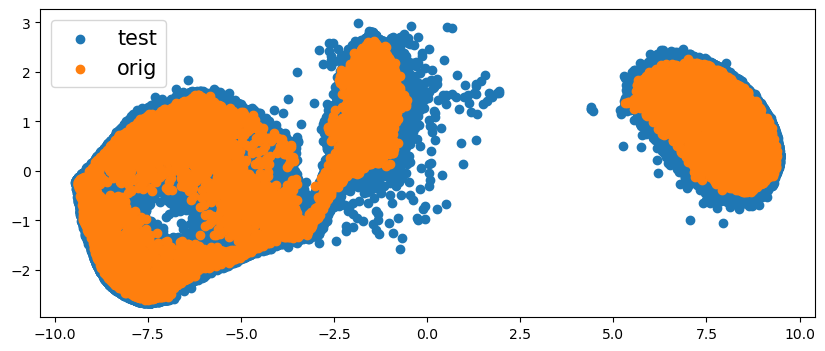

In [201]:
import matplotlib.pyplot as plt

plt.scatter(x=tsne_test_embedding[:, 0], y=tsne_test_embedding[:, 1], label='test')
plt.scatter(x=tsne_mapper_embedding[:, 0], y=tsne_mapper_embedding[:, 1], label='orig')
plt.legend(fontsize=15)
plt.gcf().set_size_inches(10, 4)

CPU times: total: 4.06 s
Wall time: 900 ms


<Axes: >

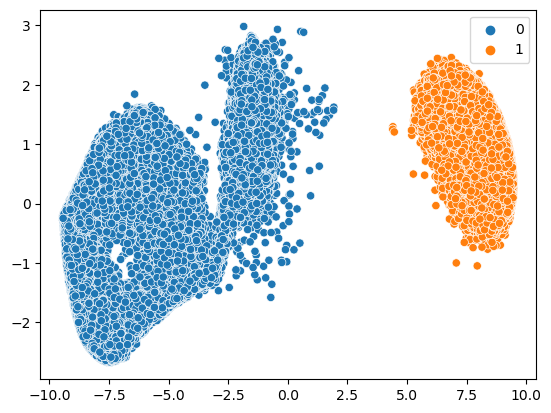

In [206]:
%%time
import fast_hdbscan

hdbscan = fast_hdbscan.HDBSCAN(min_samples=10, min_cluster_size=50)
clusters = hdbscan.fit_predict(tsne_test_embedding)

import seaborn as sns

sns.scatterplot(x=tsne_test_embedding[:, 0], y=tsne_test_embedding[:, 1], hue=clusters)

У нас получилось отделить кусок курильщиков! Я оказался прав насчет того что данные заметно отличались на некоторых признаках.

Попробуем взять только 3 признака, по которым видно различие.

In [216]:
favorite_cols = ['weight_kg', 'hemoglobin', 'new_log_gtp']

In [224]:
fig = px.scatter_3d(df_tr, x = 'weight_kg', y = 'hemoglobin', z = 'new_log_gtp', color = 'smoking')
fig.update_traces(marker_size=2.5)
fig.show()

Тоже видно раздаление. Кластеризуем.

In [225]:
plot_cols = np.r_[favorite_cols, ['smoking']]
plot_data_tr = df_tr[plot_cols].copy()
plot_data_tst = df_tst[plot_cols].sample(1_000, random_state=911)
plot_data = pd.concat([plot_data_tr, plot_data_tst], axis=0, sort=False, ignore_index=True)

In [226]:
means = plot_data_tr[favorite_cols].mean(axis=0)
stds = plot_data_tr[favorite_cols].std(axis=0)

plot_data_tr.loc[:, favorite_cols] = (plot_data_tr.loc[:, favorite_cols] - means) / stds
plot_data_tst.loc[:, favorite_cols] = (plot_data_tst.loc[:, favorite_cols] - means) / stds
plot_data_scaled = pd.concat([plot_data_tr, plot_data_tst], axis=0, sort=False, ignore_index=True)

In [227]:
results = plot_standard_embeddings(plot_data_scaled, favorite_cols, return_results=True)

Loading BokehJS ...

100%|██████████| 4/4 [01:24<00:00, 21.18s/it]


    'data': [{'hovertemplate': 'smoking=1<br>x=%{x}<br>y=%{y}<br>z=%{z}<extra></…

In [228]:
%%time
tsne_mapper_embedding = results['tsne 2D perplexity=60 exaggeration=4 dof=0.5']['embedding']

data_tst = df_tst[favorite_cols].copy()
data_tst.loc[:, favorite_cols] = (data_tst.loc[:, favorite_cols] - means) / stds

tsne_test_embedding = tsne_mapper_embedding.transform(data_tst[favorite_cols], perplexity=60)

CPU times: total: 7min 57s
Wall time: 59.8 s


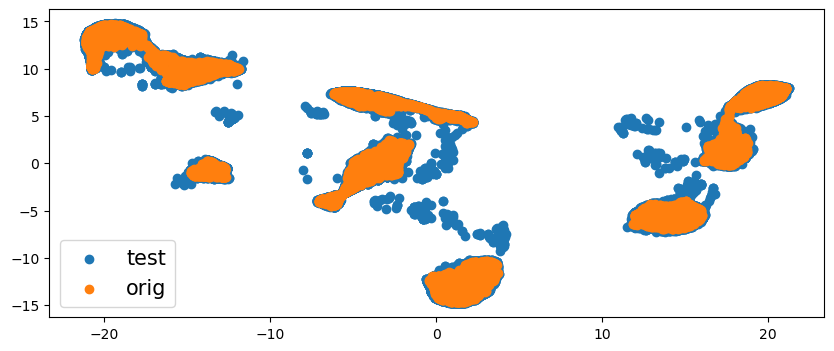

In [229]:
import matplotlib.pyplot as plt

plt.scatter(x=tsne_test_embedding[:, 0], y=tsne_test_embedding[:, 1], label='test')
plt.scatter(x=tsne_mapper_embedding[:, 0], y=tsne_mapper_embedding[:, 1], label='orig')
plt.legend(fontsize=15)
plt.gcf().set_size_inches(10, 4)

CPU times: total: 10.4 s
Wall time: 2.73 s


<Axes: >

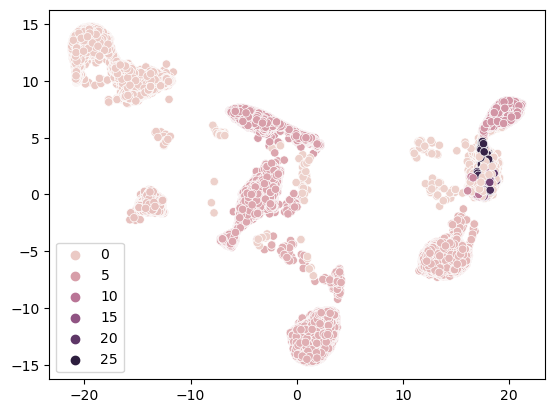

In [232]:
%%time
import fast_hdbscan

hdbscan = fast_hdbscan.HDBSCAN(min_samples=20, min_cluster_size=100)
clusters = hdbscan.fit_predict(tsne_test_embedding)

import seaborn as sns

sns.scatterplot(x=tsne_test_embedding[:, 0], y=tsne_test_embedding[:, 1], hue=clusters)

... Получилось что-то неадекватное, сам не понимаю почему ... Вообще не понятно поведение данных. Попробуем взять другие признаки.

In [234]:
df_tr.columns

Index(['age', 'height_cm', 'weight_kg', 'waist_cm', 'eyesight_left',
       'eyesight_right', 'systolic', 'relaxation', 'fasting_blood_sugar',
       'cholesterol', 'hdl', 'ldl', 'hemoglobin', 'serum_creatinine',
       'dental_caries', 'new_log_gtp', 'new_log_triglyceride', 'new_log_ast',
       'new_log_alt', 'smoking'],
      dtype='object')

In [235]:
favorite_cols = ['hdl', 'new_log_triglyceride', 'hemoglobin', 'dental_caries']

In [237]:
fig = px.scatter_3d(df_tr, x = 'hdl', y = 'new_log_triglyceride', z = 'dental_caries', color = 'smoking')
fig.update_traces(marker_size=2.5)
fig.show()

По этому графику уже видно, что кластеризовать не получится.

Проведя небольшой ресерч, я сделал вывод о том, что эти данные четко грамотно разделить на классы не получится, они все будет не очень точными, по крайней мере менее точными, чем логистическая регрессия.

### Протестируем нашу новую функцию с добавленной сеткой.

In [242]:
from utils.utils import *

In [246]:
def plot_standard_embeddings(plot_data, features, return_results=False):
    '''
    рисует "какие-то" эмбеддинги с hue='smoking' на одних и тех же фичах features
    '''
    mapper_dict = {
        'tsne 2D perplexity=60 exaggeration=4': {
            'params': {
                'n_jobs': 8,
                'perplexity': 60,
                'verbose': False,
                'n_components': 2,
                'exaggeration': 4,
                'neighbors': 'pynndescent' # annoy - neighbors по умолчанию - почему-то виснет на .transform
            },
            'func': make_tsne,
        },
        'tsne 2D perplexity=60 exaggeration=4 dof=0.5': {
            'params': {
                'n_jobs': -1,
                'perplexity': 60,
                'verbose': False,
                'n_components': 2,
                'exaggeration': 4,
                'dof': 0.5,
                'neighbors': 'pynndescent'
            },
            'func': make_tsne,
        },
        'tsne 2D perplexity=60 exaggeration=8 dof=2': {
            'params': {
                'n_jobs': -1,
                'perplexity': 60,
                'verbose': False,
                'n_components': 2,
                'exaggeration': 8,
                'dof': 2,
                'neighbors': 'pynndescent'
            },
            'func': make_tsne,
        },
        'UMAP 2D n_neighbors=17': {
            'params': {
               'n_neighbors': 17,
               'min_dist': 0.1,
               'n_jobs': 8,
               'verbose': False,
               'n_components': 2
            },
            'func': make_umap,
        },
        'UMAP 2D n_neighbors=34': {
            'params': {
               'n_neighbors': 34,
               'min_dist': 0.1,
               'n_jobs': 8,
               'verbose': False,
               'n_components': 2
            },
            'func': make_umap,
        },
        'PCA 3D': {
            'params': {
               'n_components': 3
            },
            'func': make_pca,
        },
        'PCA 3D': {
            'params': {
               'n_components': 3
            },
            'func': make_pca,
        },
    }

    res = plot_dim_reduction_improved(
        data=plot_data,
        mapper_dict=mapper_dict,
        default_features=features,
        default_hue_info=hue_info(field_name='smoking', is_categorical=True),
        row_height=450,
        return_results=return_results
    )
    return res

results = plot_standard_embeddings(plot_data_scaled_new, favorite_cols_new, return_results=True)

Loading BokehJS ...

100%|██████████| 6/6 [02:19<00:00, 23.32s/it]


    'data': [{'hovertemplate': 'smoking=0<br>x=%{x}<br>y=%{y}<br>z=%{z}<extra></…